<a href="https://colab.research.google.com/github/Devaki01/Fair-Food/blob/main/Fair_Food.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
files.upload()
print("Data Loaded")

Saving train.csv to train.csv
Data Loaded


In [3]:
import pandas as pd

train_df = pd.read_csv('train.csv')
train_df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


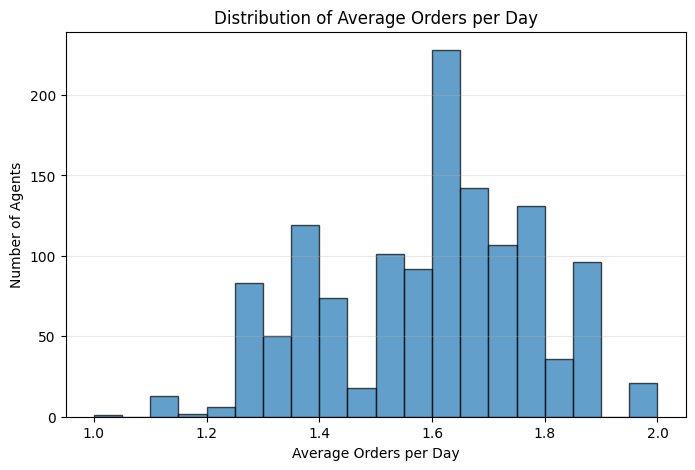

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

train_df["Order_Date"]=pd.to_datetime(train_df["Order_Date"],format="%d-%m-%Y")
orders_per_agent_day=(train_df.groupby(["Delivery_person_ID","Order_Date"]).size().groupby("Delivery_person_ID").mean())

plt.figure(figsize=(8,5))
plt.hist(orders_per_agent_day,bins=20,edgecolor="black",alpha=0.7)
plt.xlabel("Average Orders per Day")
plt.ylabel("Number of Agents")
plt.title("Distribution of Average Orders per Day")
plt.grid(axis="y",alpha=0.3)
plt.show()

In [5]:
import numpy as np

def haversine(lat1, lon1, lat2, lon2):

    R = 6371  # Earth radius in km

    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = np.sin(dlat / 2)*2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)*2
    c = 2 * np.arcsin(np.sqrt(a))

    return R * c

In [6]:
import numpy as np

LAT_MIN, LAT_MAX = 6, 37
LON_MIN, LON_MAX = 68, 97

final_df = train_df[
    (train_df["Restaurant_latitude"].between(LAT_MIN, LAT_MAX)) &
    (train_df["Restaurant_longitude"].between(LON_MIN, LON_MAX)) &
    (train_df["Delivery_location_latitude"].between(LAT_MIN, LAT_MAX)) &
    (train_df["Delivery_location_longitude"].between(LON_MIN, LON_MAX))
].copy()
print("Remaining Indian orders:", len(final_df))

final_df.loc[:, "distance_km"] = haversine(
    final_df["Restaurant_latitude"],
    final_df["Restaurant_longitude"],
    final_df["Delivery_location_latitude"],
    final_df["Delivery_location_longitude"]
)
edges_weighted = (
    final_df
    .groupby([
        "Restaurant_latitude", "Restaurant_longitude",
        "Delivery_location_latitude", "Delivery_location_longitude"
    ])
    .agg(
        order_count=("distance_km", "size"),        # raw order count
        total_distance_km=("distance_km", "sum")    # total effort
    )
    .reset_index()
)

edges_plot = edges_weighted[edges_weighted["order_count"] >= 1]
import folium

india_map = folium.Map(
    location=[22.5, 78.9],
    zoom_start=5,
    tiles="CartoDB positron"
)

# Draw edges
for _, row in edges_plot.iterrows():
    folium.PolyLine(
        locations=[
            (row["Restaurant_latitude"], row["Restaurant_longitude"]),
            (row["Delivery_location_latitude"], row["Delivery_location_longitude"])
        ],
        weight=min(1 + row["order_count"] / 5, 8),
        color="purple",
        opacity=0.6,
        tooltip=(
            f"Orders: {row['order_count']}<br>"
            f"Total distance: {row['total_distance_km']:.2f} km"
        )
    ).add_to(india_map)

# Restaurants
for _, row in edges_plot.iterrows():
    folium.RegularPolygonMarker(
        location=[row["Restaurant_latitude"], row["Restaurant_longitude"]],
        number_of_sides=3,
        radius=6,
        color="red",
        fill=True,
        fill_opacity=0.9
    ).add_to(india_map)

# Delivery locations
for _, row in edges_plot.iterrows():
    folium.CircleMarker(
        location=[row["Delivery_location_latitude"], row["Delivery_location_longitude"]],
        radius=3,
        color="blue",
        fill=True,
        fill_opacity=0.7
    ).add_to(india_map)

india_map

Remaining Indian orders: 41522


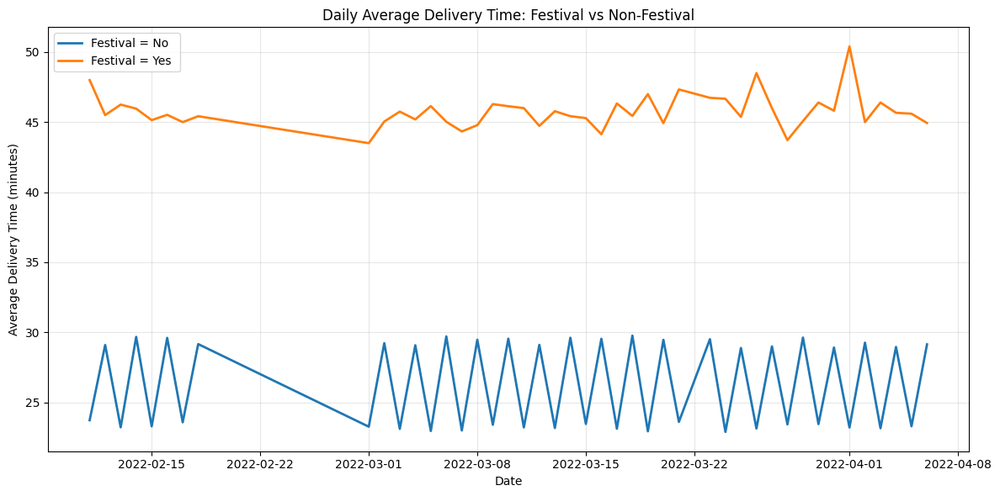

In [7]:
final_df["Order_Date"] = pd.to_datetime(
    final_df["Order_Date"], format="%d-%m-%Y"
)
final_df["Time_taken_min"] = (
    final_df["Time_taken(min)"]
    .astype(str)
    .str.extract(r"(\d+)")
    .astype(float)
)
# plot_df = final_df.dropna(
#     subset=["Order_Date", "Festival", "Time_taken_min"]
# )
plot_df = final_df[final_df["Festival"].isin(["Yes ", "No "])].copy()

daily_time = (
    plot_df
    .groupby(["Order_Date", "Festival"])["Time_taken_min"]
    .mean()
    .reset_index()
)

daily_pivot = daily_time.pivot(
    index="Order_Date",
    columns="Festival",
    values="Time_taken_min"
)
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

for col in daily_pivot.columns:
    plt.plot(
        daily_pivot.index,
        daily_pivot[col],
        label=f"Festival = {col}",
        linewidth=2
    )

plt.xlabel("Date")
plt.ylabel("Average Delivery Time (minutes)")
plt.title("Daily Average Delivery Time: Festival vs Non-Festival")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

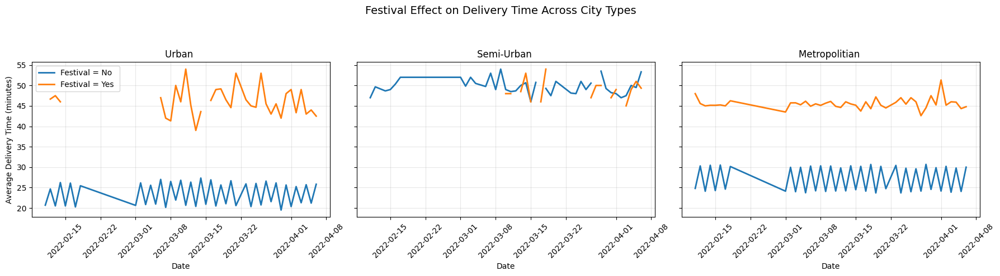

In [8]:
plot_df = final_df[
    final_df["Festival"].isin(["Yes ", "No "]) &
    final_df["City"].isin(["Urban ", "Semi-Urban ", "Metropolitian "])
].copy()

daily_city_fest = (
    plot_df
    .groupby(["Order_Date", "City", "Festival"])["Time_taken_min"]
    .mean()
    .reset_index()
)
import matplotlib.pyplot as plt

cities = ["Urban ", "Semi-Urban ", "Metropolitian "]

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(18,5),
    sharey=True
)

for ax, city in zip(axes, cities):
    city_df = daily_city_fest[daily_city_fest["City"] == city]

    city_pivot = city_df.pivot(
        index="Order_Date",
        columns="Festival",
        values="Time_taken_min"
    )

    for fest in city_pivot.columns:
        ax.plot(city_pivot.index,city_pivot[fest],label=f"Festival = {fest}",linewidth=2)
    ax.set_title(city)
    ax.set_xlabel("Date")
    ax.grid(alpha=0.3)
    ax.tick_params(axis="x", rotation=45)
axes[0].set_ylabel("Average Delivery Time (minutes)")
axes[0].legend()
plt.suptitle("Festival Effect on Delivery Time Across City Types",fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

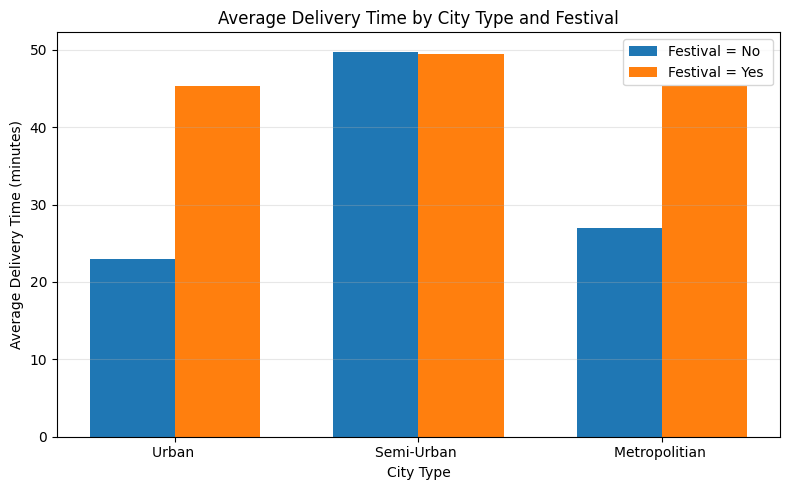

In [9]:
city_festival_avg = (
    final_df[
        final_df["City"].isin(["Urban ", "Semi-Urban ", "Metropolitian "]) &
        final_df["Festival"].isin(["Yes ", "No "])
    ]
    .groupby(["City", "Festival"])["Time_taken_min"]
    .mean()
    .reset_index()
)

city_festival_avg
import matplotlib.pyplot as plt
import numpy as np

cities = ["Urban ", "Semi-Urban ", "Metropolitian "]
festival_types = ["No ", "Yes "]

# Bar positions
x = np.arange(len(cities))
width = 0.35

fig, ax = plt.subplots(figsize=(8,5))

for i, fest in enumerate(festival_types):
    values = [
        city_festival_avg[
            (city_festival_avg["City"] == city) &
            (city_festival_avg["Festival"] == fest)
        ]["Time_taken_min"].values[0]
        for city in cities
    ]

    ax.bar(
        x + i * width,
        values,
        width,
        label=f"Festival = {fest}"
    )

# Labels & formatting
ax.set_xticks(x + width / 2)
ax.set_xticklabels(cities, rotation=0)
ax.set_ylabel("Average Delivery Time (minutes)")
ax.set_xlabel("City Type")
ax.set_title("Average Delivery Time by City Type and Festival")
ax.legend()
ax.grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()